# Still a divided city? Exploration of Airbnb data in Berlin

**Explorative data analysis of the Berlin AirBnB dataset from 13-Oct-2020**

![Berlin](img/berlin.jpg)


## 1. Problem defintion

The purpose of this Airbnb Berlin dataset analysis is to answer the following questions:

1. What are the key factors that influence the price?
2. Where are the most expensive neighbourhoods?
3. Where are the most popular neighbourhoods?

## 2. Data

The analysed dataset was downloaded directly from the [AirBnB webpage](http://insideairbnb.com/get-the-data.html).
Specifically, the following files were used for this analysis:

* `listings.csv.gz` – Summary information and metrics for listings in Berlin.
* `reviews.csv.gz` – Summary Review data and Listing ID (to facilitate time based analytics and visualisations linked to a listing).
* `neighbourhoods.csv` – Neighbourhood list for geo filter. Sourced from city or open source GIS files.
* `neighbourhoods.geojson` – GeoJSON file of neighbourhoods of the city.

## 3. Data preperation

**Import packages and load data**

In [10]:
# import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from collections import Counter
from scipy.stats import zscore
from wordcloud import WordCloud
from tqdm import tqdm

# set options
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
pd.set_option('display.max_rows', 100)
pd.options.mode.chained_assignment = None

sns.set(font_scale=1.4)
sns.set_theme(style="white")

In [11]:
# import listings and review data
df_full = pd.read_csv('./data/listings.csv.gz')
print(df_full.shape)
df_full.head().T

(20227, 74)


,0,1,2,3,4
id,2015,3176,3309,7071,9991
listing_url,https://www.airbnb.com/rooms/2015,https://www.airbnb.com/rooms/3176,https://www.airbnb.com/rooms/3309,https://www.airbnb.com/rooms/7071,https://www.airbnb.com/rooms/9991
scrape_id,20201013162227,20201013162227,20201013162227,20201013162227,20201013162227
last_scraped,2020-10-21,2020-10-20,2020-10-21,2020-10-19,2020-10-20
name,Berlin-Mitte Value! Quiet courtyard/very central,Fabulous Flat in great Location,BerlinSpot Schöneberg near KaDeWe,BrightRoom with sunny greenview!,Geourgeous flat - outstanding views
description,Great location! <br />30 of 75 sq meters. Thi...,This beautiful first floor apartment is situa...,First of all:<br />I prefer short-notice booki...,Cozy and large room in the beautiful district ...,4 bedroom with very large windows and outstand...
neighborhood_overview,It is located in the former East Berlin area o...,The neighbourhood is famous for its variety of...,"My flat is in the middle of West-Berlin, direc...","Great neighborhood with plenty of Cafés, Baker...",Prenzlauer Berg is an amazing neighbourhood wh...
picture_url,https://a0.muscache.com/pictures/260fd609-710a...,https://a0.muscache.com/pictures/243355/84afcf...,https://a0.muscache.com/pictures/29054294/b1fa...,https://a0.muscache.com/pictures/21278/32a1622...,https://a0.muscache.com/pictures/42799131/59c8...
host_id,2217,3718,4108,17391,33852
host_url,https://www.airbnb.com/users/show/2217,https://www.airbnb.com/users/show/3718,https://www.airbnb.com/users/show/4108,https://www.airbnb.com/users/show/17391,https://www.airbnb.com/users/show/33852


**Data cleaning**

In [12]:
# select the columns of interest for further data analysis
col_to_keep = ['id', 'neighbourhood_cleansed','neighbourhood_group_cleansed',
            'latitude', 'longitude','property_type','room_type',
            'accommodates', 'beds', 'amenities', 'price', 'number_of_reviews',
            'first_review','last_review', 'reviews_per_month']

In [13]:
# transform functions:

def clean_data(df):
    """
    Transform columns of df to appropriate dtypes and handle integer missing values
    """
    
    # convert price column to numeric
    if not pd.api.types.is_numeric_dtype(df['price']):
        df.loc[:,'price'] = df.loc[:,'price'].str.replace('[$,]','').astype('float')
    
    # transform columns to int
    to_int = ['accommodates','beds','number_of_reviews']
    df.loc[:,to_int] = df.loc[:,to_int].apply(lambda x: x.fillna(x.median(), axis=0)) 
    df.loc[:,to_int] = df.loc[:,to_int].astype('int')
        
    # transform columns to categorical
    to_cat = ['neighbourhood_cleansed','neighbourhood_group_cleansed', 'property_type','room_type']
    df.loc[:,to_cat] = df.loc[:,to_cat].astype('category')

    # transfrom columns to datetimes
    to_dt = ['first_review','last_review']
    df.loc[:,to_dt] = df.loc[:,to_dt].apply(pd.to_datetime)
    
    return df    


def check_is_west_berlin(df, berlin_wall_shapefile='./data/berlin-wall.geojson'):
    """
    Check if the accommodation is located in the former west or eastern part of Berlin.
    """
    
    # read shape file with the former west-berlin area and transform it as a polygon
    west_berlin_shp = gpd.read_file(berlin_wall_shapefile)
    west_berlin_poly = Polygon(west_berlin_shp.loc[0, 'geometry'])
    
    # check if the listing's longitude and latiude is within the west-berlin polygion
    return [Point(row.longitude, row.latitude).within(west_berlin_poly) for row in df.itertuples()]


def expand_amenities(df, min_entries = 10):
    """
    Expand the amenitieslist and create boolean columns (one-hot) for the most common entries
    """
    
    # create a Counter-dict to count the occurence of all amenity entries
    all_amenities = [item for row in df.amenities for item in eval(row)]
    ctr_amenities = Counter(all_amenities)
    
    # filter the amenities according to min_entries
    common_amenities = {key for key, value in ctr_amenities.items() if value > min_entries}

    # loop over amenities, check occurence and create boolean 
    for amenity in tqdm(common_amenities):
        df[f"has_{amenity.replace(' ','_')}"] = [amenity in eval(row) for row in df.amenities]

    # count the number all amenities
    df['amenities_count'] = df.loc[:,df.columns.str.contains('has_')].sum(axis=1)
    
    return df, all_amenities 


# transform dtypes
df = clean_data(df_full[col_to_keep])

# add boolean feature, if the neighbourhood is located in former west berlin
df.loc[:,'is_west'] = check_is_west_berlin(df)

# one-hot expantion of the nested amenitieslists
df, all_amenities = expand_amenities(df)
df.drop('amenities', axis=1, inplace=True)

100%|██████████| 110/110 [00:58<00:00,  1.88it/s]


**Manual data cleaning and feature engenieering**

In [14]:
# add feature not_reviewed
df['not_reviewed'] = df.first_review.isnull()  

# add feature review_time_year
df['review_time_year'] = (df.last_review.dt.year - df.first_review.dt.year)
df.drop(['first_review','last_review'], axis=1, inplace=True)

# handle outliers with thresholds
MAX_PRICE, MAX_BEDS, MAX_BEDROOMS = 800, 20, 15
df = df.query('(1 < price <= @MAX_PRICE) & (beds <= @MAX_BEDS)')
     
# add feature: standardized price   
df.loc[:,'price_std'] = zscore(df.loc[:,'price'])

# add feature: reviews per neighborhoods (used as popularity)
len_by_group = df.groupby('neighbourhood_group_cleansed').agg({'id':len}).reset_index()
len_by_group.columns = len_by_group.columns.str.replace('id','len_by_group')

len_by_dist = df.groupby('neighbourhood_cleansed').agg({'id':len}).reset_index()
len_by_dist.columns = len_by_dist.columns.str.replace('id','len_by_dist')

df = df.merge(len_by_group, on='neighbourhood_group_cleansed')
df = df.merge(len_by_dist, on='neighbourhood_cleansed')

# add feature: boolean column for the most common property_types
df['is_apartment'] = (df['property_type'] == 'Entire apartment')
df['is_room'] = (df['property_type'] == 'Private room')

# manual fix misslocated east/west locations
df = df.loc[~((df.neighbourhood_group_cleansed == "Steglitz - Zehlendorf") & (df.is_west == False)),:]
df = df.loc[~((df.neighbourhood_group_cleansed == "Spandau") & (df.is_west == False)),:]

## 4. Data Analysis


### What are the key factors in Airbnb listing prices?

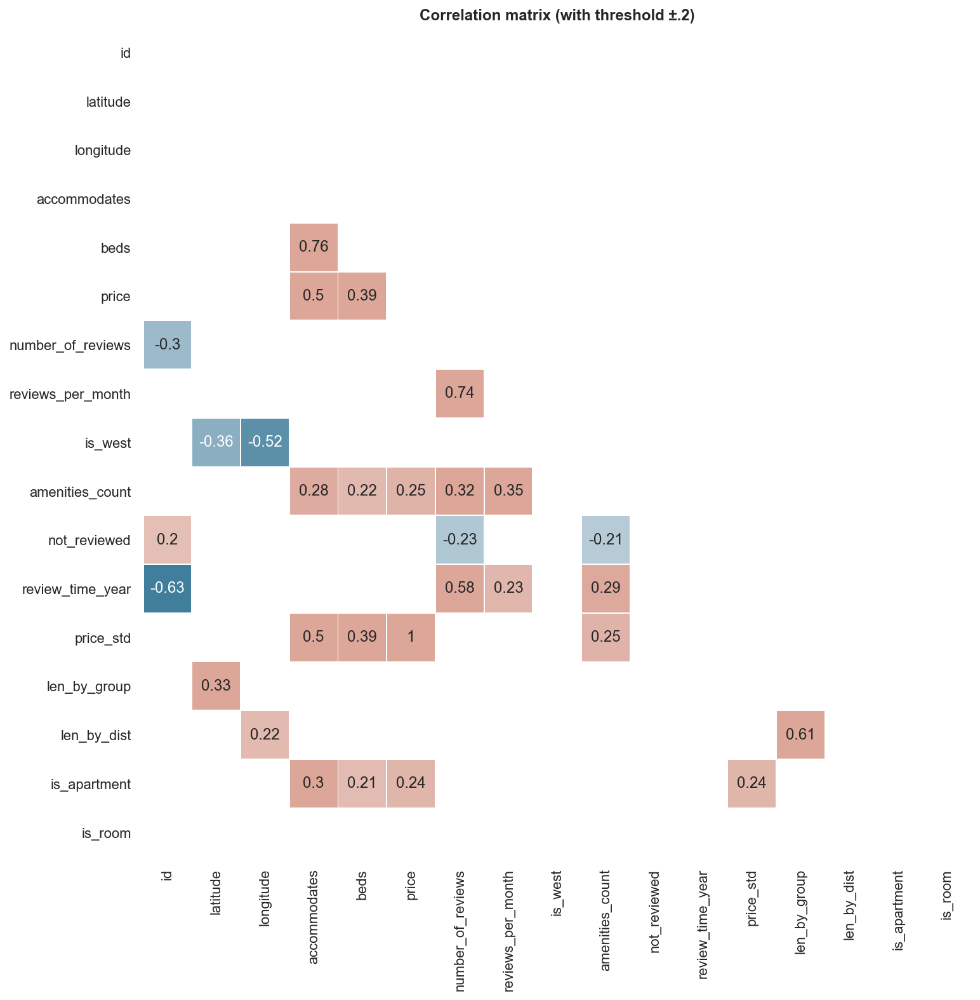

In [15]:
# Correlation analyis with numeric features and without amenities for visual purpose

# create corrlation matrix without amenities columns
cor_mat = df.iloc[:,~df.columns.str.contains('has')].corr()

# remove absolute correlation coefficients less than corr_threshold
corr_threshold = .2
cor_mat[abs(cor_mat) <= corr_threshold] = np.nan

# mask for the upper triangle
mask = np.triu(np.ones_like(cor_mat, dtype=bool))

# plot
fig, ax = plt.subplots(figsize=(12, 12))
cmap = sns.diverging_palette(230, 20, as_cmap=True, )
sns.heatmap(cor_mat, cmap=cmap,  center=0, mask=mask, vmax=.3, annot=True,
            square=True, linewidths=.5, cbar=False)
ax.set_title('Correlation matrix (with threshold ±.2)', fontweight='bold')
plt.show()

In [16]:
# perform correlation and exctract variable
var = 'price'
corr_df = df.corr()
corr_price = corr_df[[var]]
    
    # drop var 
corr_price.drop(var, axis=0, inplace=True)
if var == 'price':

    corr_price.drop('price_std', axis=0, inplace=True)
    
    # handle colors: red for negative and green for positive correlations
corr_price['col'] = ['red' if price < 0 else 'green' for price in corr_price[var]]
top = corr_price.nlargest(columns=[var], n=10)
tail = corr_price.nsmallest(columns=[var], n=10)

corr_price = pd.concat([top, tail])

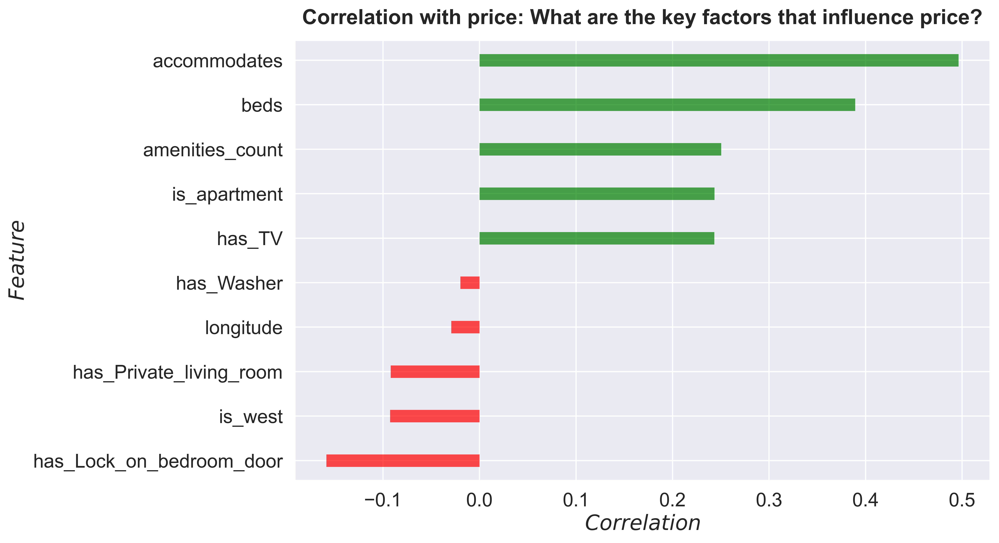

In [17]:
# Price specific analysis
sns.set(font_scale=1.4)
def corr_bar_plot(df, var:str, ax, top_tail=False):
    """
    Perform correlation analysis and plot r as horizontal bars.
    """
    
    # perform correlation and exctract variable
    corr_df = df.corr()
    corr_price = corr_df[[var]]
    
    # drop var 
    corr_price.drop(var, axis=0, inplace=True)
    if var == 'price':
        corr_price.drop('price_std', axis=0, inplace=True)
    
    # handle colors: red for negative and green for positive correlations
    corr_price['col'] = ['red' if price < 0 else 'green' for price in corr_price[var]]
    
    if top_tail:        
        top = corr_price.nlargest(columns=[var], n=top_tail)
        tail = corr_price.nsmallest(columns=[var], n=top_tail)
        corr_price = pd.concat([top, tail])
    
    corr_price.sort_values(var, inplace=True)
    corr_price.reset_index(inplace=True)
      
    # plot
    ax.hlines(y=corr_price.index, xmin=0, xmax=corr_price[var], color=corr_price.col, alpha=0.7, linewidth=10)
    ax.set(ylabel='$Feature$',
           xlabel='$Correlation$')
    plt.yticks(corr_price.index, corr_price['index'])
    
    return ax

# plot correlation bars
fig, ax = plt.subplots(figsize=(10,6.5), dpi=300)
ax = corr_bar_plot(df, 'price', ax=ax, top_tail=5)
ax.set_title('Correlation with price: What are the key factors that influence price?', 
             fontweight= 'bold', y=1.02) 
plt.show()

# save figure
fig.savefig('./img/correlation_top5.png', dpi=300, format='png', bbox_inches='tight')

**What are the most common amenities?**

In [18]:
# create a wordcloud
wordcloud = WordCloud(max_font_size=120, max_words=100, 
                      width=960, height=480,
                      collocations=False, background_color="white").generate(' '.join(all_amenities))

# plot a wordcloud
fig, ax = plt.subplots(figsize=(16,16), dpi=400)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

fig.savefig('./img/word_cloud.png', dpi=400, format='png', bbox_inches='tight')

In [19]:
# Room type vs price
tmp = df.groupby(['room_type'])['price'].agg([np.nanmedian, len]).round(2).dropna().reset_index()
tmp.sort_values(by = 'nanmedian', inplace=True, ascending=False)
tmp

,room_type,nanmedian,len
1,Hotel room,92.0,228.0
0,Entire home/apt,70.0,10940.0
2,Private room,35.0,8728.0
3,Shared room,20.0,279.0


In [20]:
# Property type vs price
tmp = df.groupby(['property_type'])['price'].agg([np.nanmedian, len]).round(2).dropna().reset_index()
tmp.sort_values(by = 'nanmedian', inplace=True, ascending=False)
tmp.nlargest(n=10, columns='len')

,property_type,nanmedian,len
4,Entire apartment,67.00,9573.0
23,Private room in apartment,35.00,7788.0
15,Entire loft,96.00,353.0
8,Entire condominium,79.00,305.0
17,Entire serviced apartment,108.50,302.0
35,Private room in house,35.00,233.0
29,Private room in condominium,35.00,187.0
14,Entire house,112.14,181.0
49,Room in hotel,69.00,175.0
53,Shared room in apartment,27.00,153.0


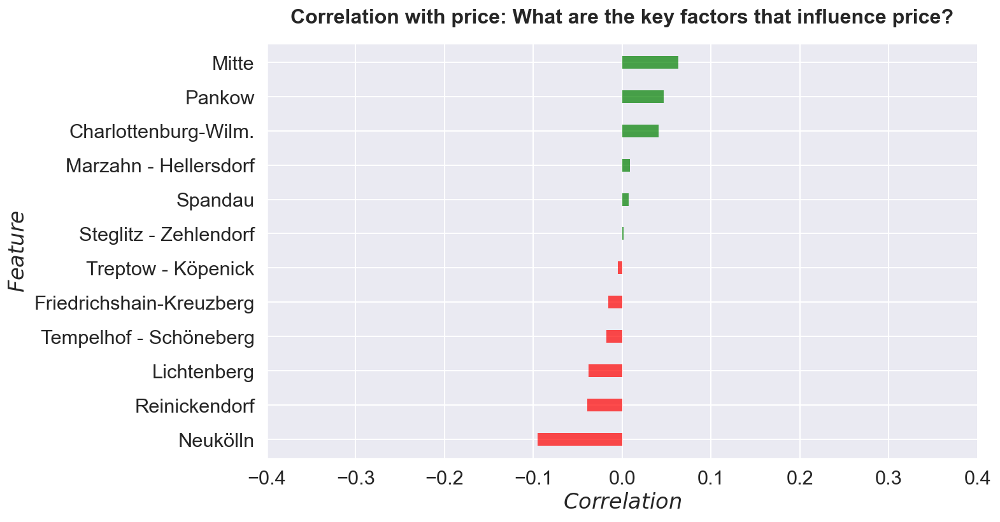

In [21]:
# correlation districts vs price
dums = pd.get_dummies(df.neighbourhood_group_cleansed)
tmp = df[['price','price_std']].join(dums)

fig, ax= plt.subplots(figsize=(10,6))
corr_bar_plot(tmp, 'price', ax=ax)
ax.set_title(f'Correlation with price: What are the key factors that influence price?', 
             fontweight= 'bold', fontsize=16, y=1.03) 
plt.xlim(-.4,.4)
plt.show()

### Where are the most expensive neighbourhoods?

In [22]:
# boxplot example
cols = ['price', 'accommodates' ,'beds','number_of_reviews', 'amenities_count']

In [23]:
# contrain summary
df.query('(beds == 1.) & (accommodates == 2)').groupby(['is_west'])[cols].agg(np.median).dropna().T

is_west,False,True
price,49.0,40.0
accommodates,2.0,2.0
beds,1.0,1.0
number_of_reviews,5.0,4.0
amenities_count,14.0,12.0


In [24]:
# contrain summary 2
display(df.groupby(['accommodates','is_west']).agg({'price':np.nanmedian}).head(10).T)

accommodates     1             2           3           4            5      
is_west      False True    False True  False True  False True   False True 
price         30.0  30.0  49.145  42.0  64.0  55.0  79.0  70.0  100.0  98.0

In [25]:
# neighbourhood_group vs. price
tmp = df.groupby(['neighbourhood_group_cleansed','is_west']).agg({'price':np.nanmedian}).round(2).dropna()
tmp.sort_values(by = 'price', inplace=True, ascending=False)
tmp

price
neighbourhood_group_cleansed is_west       
Mitte                        False     73.0
Pankow                       False     58.0
Charlottenburg-Wilm.         True      55.0
Marzahn - Hellersdorf        False     50.5
Friedrichshain-Kreuzberg     False     50.0
                             True      50.0
Tempelhof - Schöneberg       True      50.0
Treptow - Köpenick           False     50.0
Pankow                       True      49.0
Steglitz - Zehlendorf        True      49.0
Spandau                      True      43.5
Neukölln                     True      43.0
Mitte                        True      41.0
Lichtenberg                  False     40.0
Reinickendorf                True      40.0
                             False     30.0

In [26]:
# neighbourhood_group vs price contrained
tmp = df.query('(beds == 1.) & (accommodates == 2)').groupby(['neighbourhood_group_cleansed','is_west']).agg({'price':np.nanmedian}).round(2).dropna()
tmp.sort_values(by = 'price', inplace=True, ascending=False)
tmp

,,price
neighbourhood_group_cleansed,is_west,
Mitte,False,60.0
Pankow,False,49.0
Friedrichshain-Kreuzberg,True,48.0
Charlottenburg-Wilm.,True,45.0
Friedrichshain-Kreuzberg,False,45.0
Spandau,True,45.0
Tempelhof - Schöneberg,True,45.0
Marzahn - Hellersdorf,False,40.0
Neukölln,True,40.0


In [27]:
# Aggregte Data for geo-spatial analysis
def agg_and_plot(df_mat, 
                 aggfun=np.median,
                 neighbourhoods_path = './data/neighbourhoods.geojson',
                 wall_path = './data/berlin_wall.json'):
    """
    Plot the berlin map with color-coded var column for each district.
    """
    
    # read shapefile for neighbourhoods
    neighbours_shp = gpd.read_file(neighbourhoods_path)

    # create GeoDataFrame
    geo_df = gpd.GeoDataFrame(pd.merge(df_mat, neighbours_shp, 
                                    left_on='neighbourhood_cleansed', 
                                    right_on='neighbourhood')
                          )
    
    # aggreagte on 'level'
    geo_df = geo_df.dissolve(by='neighbourhood', aggfunc=aggfun)
    
    # read berlin-wall shape file
    berlin_wall = gpd.read_file(wall_path)
    
    return geo_df, berlin_wall


geo_df_contr, wall = agg_and_plot(df.query('(beds <= 1) and (accommodates == 2)'), np.median)
geo_df, _ = agg_and_plot(df, np.median)        

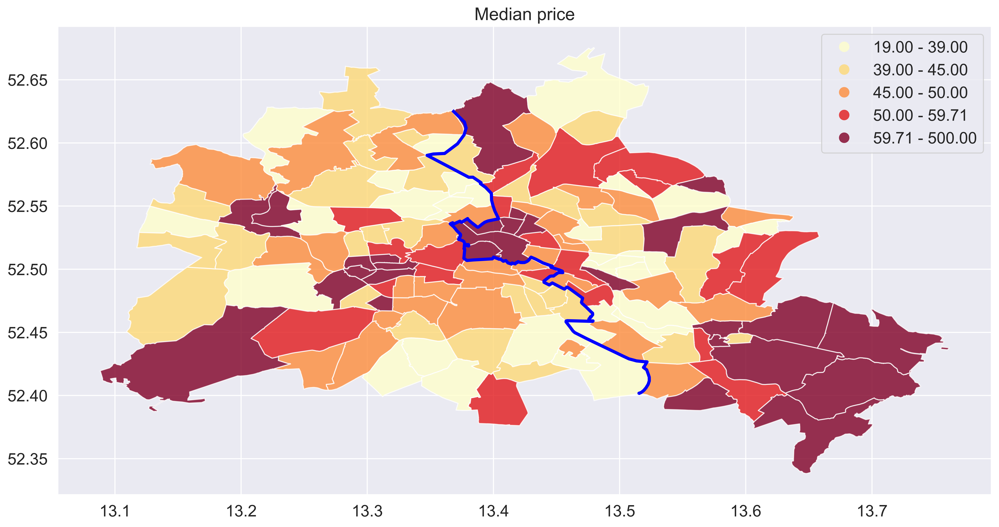

In [28]:
fig, ax = plt.subplots(figsize=(16,16), dpi=300)

plot_dict = dict(cmap='YlOrRd', scheme='quantiles', alpha=.8, edgecolor='w', legend=True)

geo_df.plot(column='price', ax=ax, **plot_dict) # natural_breaks
wall.plot(color='blue', linewidth=3, ax=ax)
ax.set_title('Median price')
plt.show()

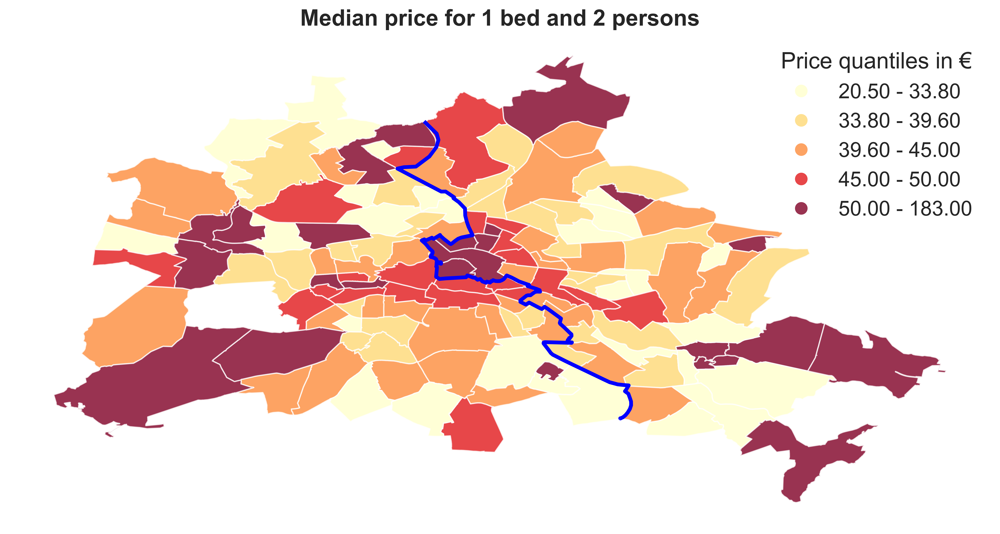

In [29]:
# map contrain with 1 bed and 2 people
sns.set(font_scale=1.5)

fig, ax = plt.subplots(figsize=(14,14), dpi=300)

plot_dict = dict(cmap='YlOrRd', 
                 scheme='quantiles', 
                 alpha=.8, 
                 edgecolor='w', 
                 legend=True, 
                 legend_kwds=dict(loc='upper right', 
                                  frameon=False, 
                                  title='Price quantiles in €'),
                )

# plot price level
geo_df_contr.plot(column='price', ax=ax, **plot_dict)
# plot berlin wall
wall.plot(color='blue', linewidth=3, ax=ax)

ax.set_title('Median price for 1 bed and 2 persons', fontweight='bold')
ax.set_axis_off()
plt.show()

fig.savefig('./img/price_map_contrained.png', format='png', dpi=300, bbox_inches='tight')

### Where are the most frequently visited neighbourhoods?

In [ ]:
# Plot the len_by_dist
fig, ax = plt.subplots(figsize=(16,16), dpi=400)

#plot_dict = dict(cmap='YlOrRd', scheme='box_plot', alpha=.8, edgecolor='w', legend=True)

plot_dict = dict(cmap='YlOrRd', 
                 scheme='quantiles', 
                 alpha=.8, 
                 edgecolor='w', 
                 legend=True, 
                 legend_kwds=dict(loc='upper right', 
                                  frameon=False, 
                                  title='Num. of reviews\nper avaible listings'),
                )

ax = geo_df.plot(column='len_by_dist',ax=ax, **plot_dict) # natural_breaks
wall.plot(color='blue', linewidth=3, ax=ax)
ax.set_title('Popular neighbourhoods in Berlin', fontweight='bold')
ax.set_axis_off()
plt.show()

fig.savefig('./img/popular_map.png', format='png', dpi=300, bbox_inches='tight')

**How does the reviews change over time?**

In [ ]:
# read reviews file and merge it to get the 'is_west' feature
reviews = pd.read_csv('./data/reviews.csv', parse_dates=['date'])
reviews = reviews.merge(df[['id','is_west']], left_on='listing_id', right_on='id')

# set dates as index and add boolean feature 
reviews.set_index('date', inplace=True)
reviews.drop(['listing_id'], axis=1, inplace=True)
reviews.head()

In [ ]:
# plot reviews over time

# resample dates by 'resample_fct', count the number, and split west and eastern counts
resample_fct = 'M'
reviews_resampled = pd.DataFrame()
reviews_resampled['reviews_sum'] = reviews.id.resample(resample_fct).count()
reviews_resampled['reviews_sum_west'] = reviews.is_west.resample(resample_fct).sum()
reviews_resampled['reviews_sum_east'] = reviews_resampled['reviews_sum'] - reviews_resampled['reviews_sum_west']

# drop dates before 2013 for visualization
reviews_resampled = reviews_resampled.truncate(before='2013')

# plot
fig, ax = plt.subplots(figsize=(16,8), dpi=400)
ax.plot(reviews_resampled.index, reviews_resampled.reviews_sum, c='grey', alpha=.4, label='Absolute')
ax.plot(reviews_resampled.index, reviews_resampled.reviews_sum_west, c='r', alpha=.8, label='West Berlin')
ax.plot(reviews_resampled.index, reviews_resampled.reviews_sum_east, c='b', alpha=.8, label='East Berlin')
plt.legend()
ax.set_title('Number of reviews over Time in former West- and East Berlin', fontweight='bold', fontsize=14)
ax.set(xlabel='Year', ylabel='Freqeuncy of reviews')
plt.show()